In [ ]:
# from
# https://www.kaggle.com/code/sayakdasgupta/fake-faces-with-dcgans

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Visualization
import cv2 # for ingesting images
print('OpenCV: %s' % cv2.__version__) # print version
import matplotlib 
import matplotlib.pyplot as plt # or data visualizationa
print('matplotlib: %s' % matplotlib.__version__) # print version
import graphviz # for showing model diagram
print('graphviz: %s' % graphviz.__version__) # print version


import sys
import os

OpenCV: 4.7.0
matplotlib: 3.6.3
graphviz: 0.20.1


In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import os
from keras import preprocessing
from keras.models import Sequential
from keras.layers import Conv2D,Dropout,Dense,Flatten,Conv2DTranspose,BatchNormalization,LeakyReLU,Reshape
import tensorflow as tf

# Loadind and Preprocessing data

In [3]:
main_dir=os.path.dirname(sys.path[0])

In [5]:
# Specify the location of images after you have downloaded them
ImgLocation = main_dir + "/HW32_Myshkavets S.A./images"

# Create a list to store image paths
ImagePaths=[]
for image in list(os.listdir(ImgLocation)):
    if image != '.DS_Store':
        ImagePaths = ImagePaths + [ImgLocation + "/" + image]
        
# Load images and resize to 64 x 64
data_lowres=[]
for img in ImagePaths:
    image = cv2.imread(img)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_lowres = cv2.resize(image, (64, 64))
    data_lowres.append(image_lowres)

# Convert image data to numpy array and standardize values (divide by 255 since RGB values ranges from 0 to 255)
for i in range(len(data_lowres)):
    data_lowres[i] = ((data_lowres[i] - data_lowres[i].min())/(255 - data_lowres[i].min()))


train_data = np.array(data_lowres)

# Show data shape
print("Shape of data_lowres: ", train_data.shape)

Shape of data_lowres:  (63565, 64, 64, 3)


# Data Visualization

<Figure size 1000x1000 with 0 Axes>

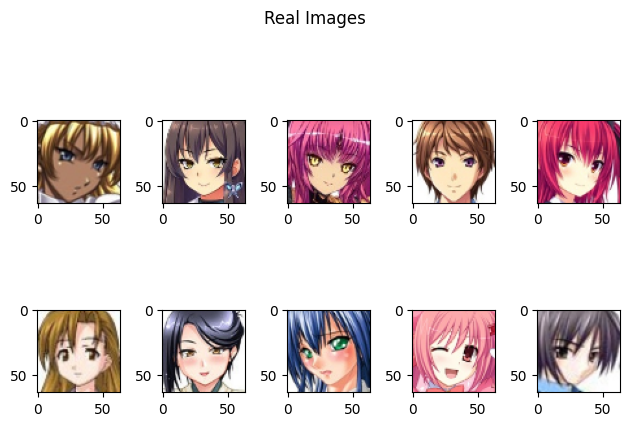

In [6]:
plt.figure(figsize=(10,10))
fig,ax=plt.subplots(2,5)
fig.suptitle("Real Images")
idx=100

for i in range(2):
    for j in range(5):
            ax[i,j].imshow(train_data[idx].reshape(64,64,3))
            idx+=100
            
plt.tight_layout()
plt.show()

In [7]:
X_train = train_data

# Generator

In [8]:
noise_shape = 100

In [9]:
generator=Sequential()
generator.add(Dense(4*4*512,input_shape=[noise_shape]))
generator.add(Reshape([4,4,512]))
generator.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(3, kernel_size=4, strides=2, padding="same",
                                 activation='sigmoid'))

Metal device set to: Apple M1 Pro


2023-04-05 20:57:25.003332: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-05 20:57:25.005211: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [10]:
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8192)              827392    
                                                                 
 reshape (Reshape)           (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 256)        2097408   
 nspose)                                                         
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 8, 8, 256)         0         
                                                                 
 batch_normalization (BatchN  (None, 8, 8, 256)        1024      
 ormalization)                                                   
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 16, 16, 128)      5

# Discriminator

In [11]:
discriminator=Sequential()
discriminator.add(Conv2D(32, kernel_size=4, strides=2, padding="same",input_shape=[64,64, 3]))
discriminator.add(Conv2D(64, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())
discriminator.add(Conv2D(128, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())
discriminator.add(Conv2D(256, kernel_size=4, strides=2, padding="same"))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Flatten())
discriminator.add(Dropout(0.5))
discriminator.add(Dense(1,activation='sigmoid'))

In [12]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        1568      
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        32832     
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 batch_normalization_3 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 128)         131200    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                      

# DCGAN (combined model)

In [13]:
GAN =Sequential([generator,discriminator])

In [14]:
discriminator.compile(optimizer='adam',loss='binary_crossentropy')
discriminator.trainable = False

In [15]:
GAN.compile(optimizer='adam',loss='binary_crossentropy')

In [16]:
GAN.layers

In [17]:
GAN.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 64, 64, 3)         3585219   
                                                                 
 sequential_1 (Sequential)   (None, 1)                 695009    
                                                                 
Total params: 4,280,228
Trainable params: 3,584,323
Non-trainable params: 695,905
_________________________________________________________________


# Training

In [18]:
epochs = 300  #set epoch according to your training dataset size,i had chosen 50k images hence epochs are high as 300...
batch_size = 128

In [19]:
D_loss=[] #list to collect loss for the discriminator model
G_loss=[] #list to collect loss for generator model

Currently on Epoch 1
	Currently on batch number 0 of 496


2023-04-05 20:57:30.124343: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-05 20:57:30.124548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-05 20:57:30.675695: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-04-05 20:57:31.438168: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
1/1 [==============================] - 0s 221ms/step


2023-04-05 20:59:16.464358: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


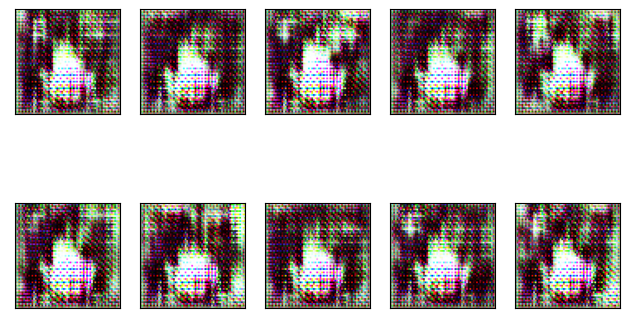

Epoch: 1,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.002
Currently on Epoch 2
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 2,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.001
Currently on Epoch 3
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 3,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.001
Currently on Epoch 4
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 4,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 5
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496


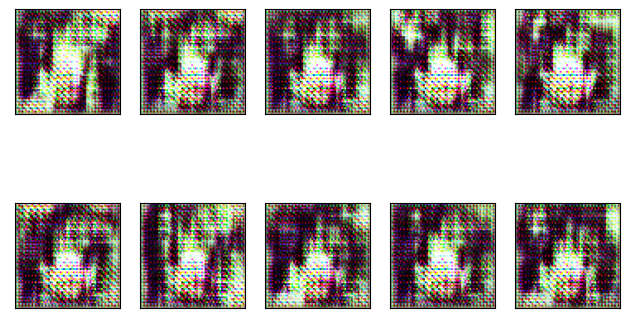

Epoch: 6,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 7
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 7,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 8
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 8,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 9
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 9,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 10
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496

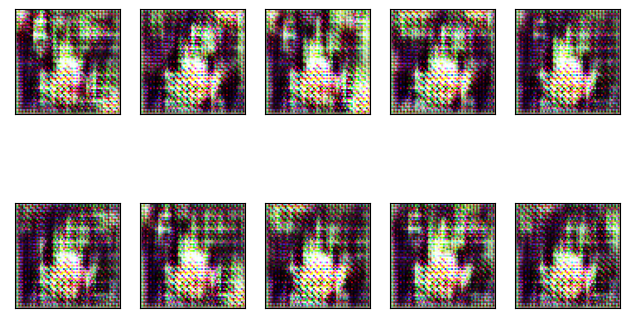

Epoch: 11,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 12
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 12,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 13
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 13,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 14
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 14,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 15
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

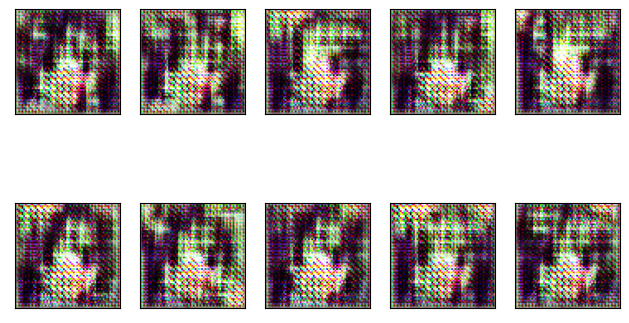

Epoch: 16,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 17
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 17,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 18
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 18,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 19
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 19,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 20
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

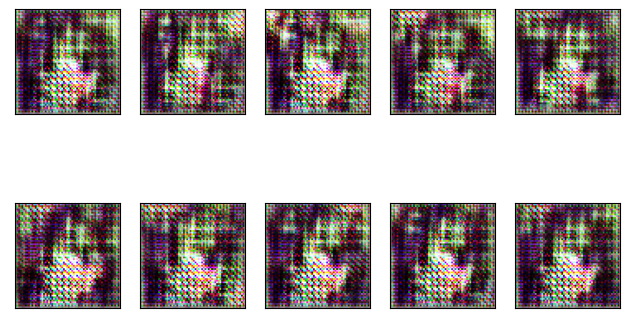

Epoch: 21,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 22
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 22,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 23
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 23,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 24
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 24,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 25
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

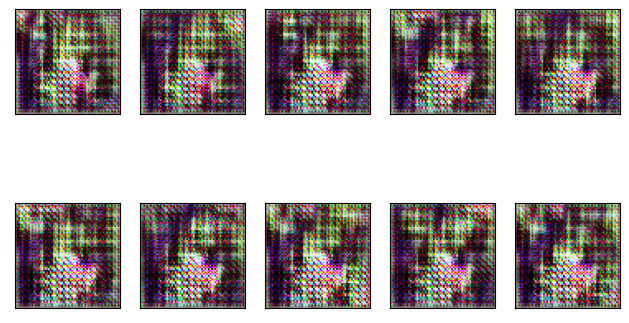

Epoch: 26,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 27
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 27,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 28
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 28,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 29
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 29,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 30
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

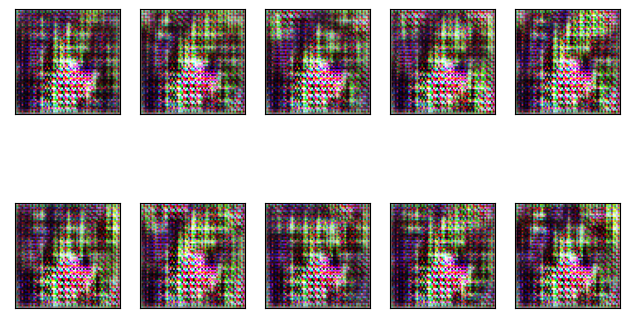

Epoch: 31,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 32
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 32,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 33
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 33,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 34
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 34,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 35
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

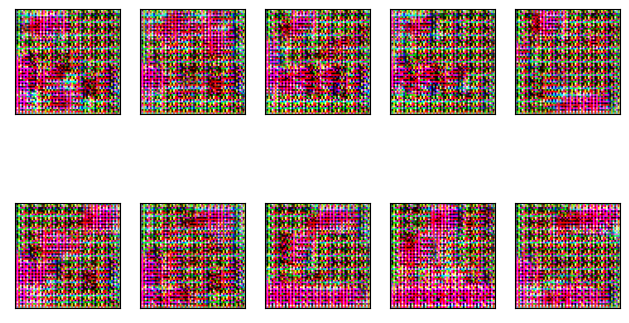

Epoch: 36,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 37
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 37,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 38
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 38,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 39
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 39,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 40
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

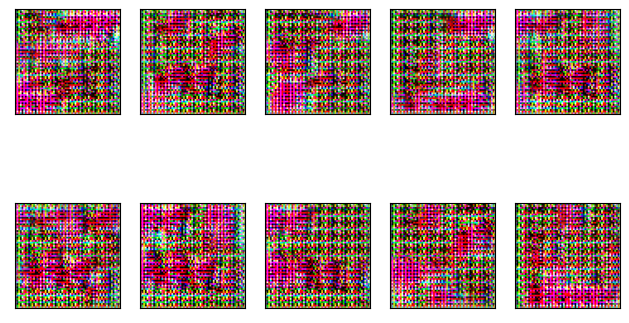

Epoch: 41,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 42
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 42,  Loss: D_real = 0.000, D_fake = 0.000,  G = 116.573
Currently on Epoch 43
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 43,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 44
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 44,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 45
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 2

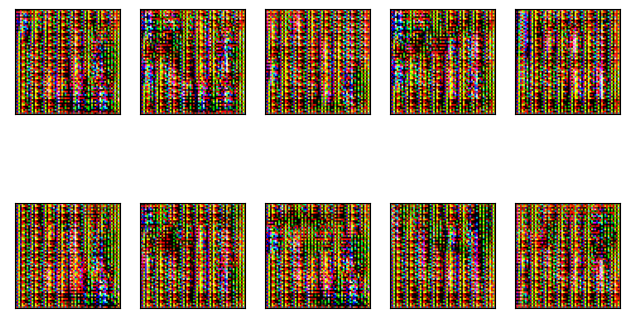

Epoch: 46,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 47
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 47,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 48
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 48,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 49
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 49,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 50
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

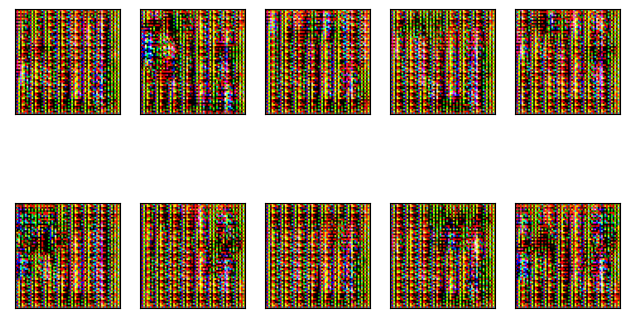

Epoch: 51,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 52
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 52,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 53
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 53,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 54
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 54,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 55
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

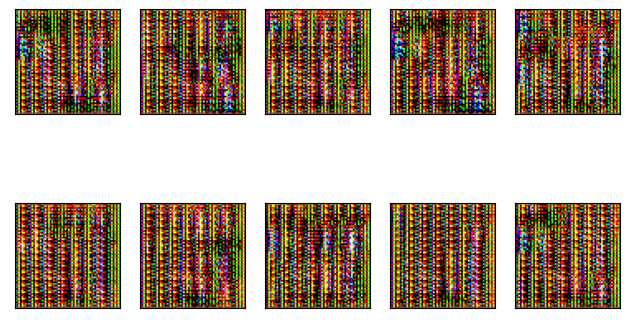

Epoch: 56,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 57
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 57,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 58
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 58,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 59
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 59,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 60
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

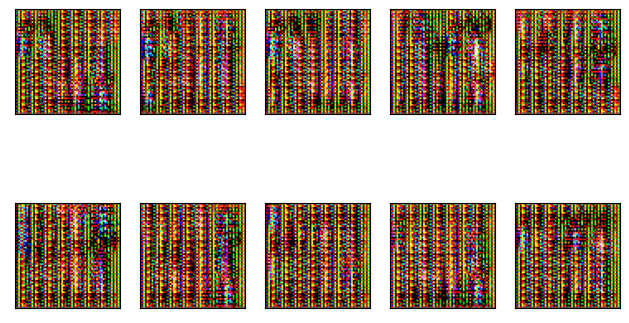

Epoch: 61,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 62
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 62,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 63
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 63,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 64
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 64,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 65
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

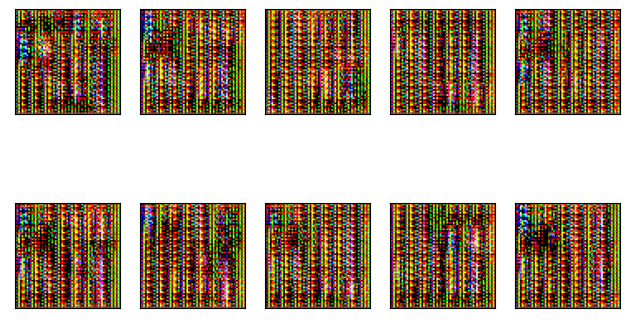

Epoch: 66,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 67
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 67,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 68
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 68,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 69
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 69,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 70
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200

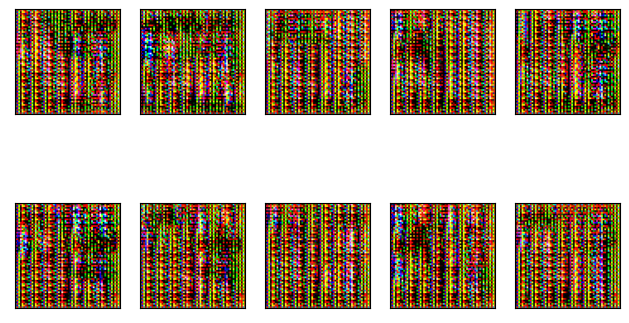

Epoch: 71,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 72
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 72,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 73
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 73,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 74
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496
	Currently on batch number 200 of 496
	Currently on batch number 300 of 496
	Currently on batch number 400 of 496
Epoch: 74,  Loss: D_real = 0.000, D_fake = 0.000,  G = 0.000
Currently on Epoch 75
	Currently on batch number 0 of 496
	Currently on batch number 100 of 496


KeyboardInterrupt: 

In [20]:
with tf.device('/gpu:0'):
 for epoch in range(epochs):
    print(f"Currently on Epoch {epoch+1}")
    
    # For every batch in the dataset
    for i in range(X_train.shape[0]//batch_size):
        
        if (i)%100 == 0:
            print(f"\tCurrently on batch number {i} of {len(X_train)//batch_size}")
            
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        
        gen_image = generator.predict_on_batch(noise)
        
        train_dataset = X_train[i*batch_size:(i+1)*batch_size]
        #train on real image
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = True
        d_loss1 = discriminator.train_on_batch(train_dataset,train_label)
        
        #train on fake image
        train_label=np.zeros(shape=(batch_size,1))
        d_loss2 = discriminator.train_on_batch(gen_image,train_label)
        
        
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = False
        #train the generator
        g_loss = GAN.train_on_batch(noise, train_label)
        D_loss.append(d_loss1+d_loss2)
        G_loss.append(g_loss)
        
         
    if epoch % 5 == 0:
        samples = 10
        x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples,100)))

        for k in range(samples):
            plt.subplot(2, 5, k+1)
            plt.imshow(x_fake[k].reshape(64,64,3))
            plt.xticks([])
            plt.yticks([])

        
        plt.tight_layout()
        plt.show()
    print('Epoch: %d,  Loss: D_real = %.3f, D_fake = %.3f,  G = %.3f' %   (epoch+1, d_loss1, d_loss2, g_loss))        
print('Training is complete')

# Output Visualization

In [21]:
noise=np.random.uniform(-1,1,size=[500,noise_shape])

In [22]:
im=generator.predict(noise)

16/16 [==============================] - 1s 31ms/step


4/4 [==============================] - 0s 12ms/step


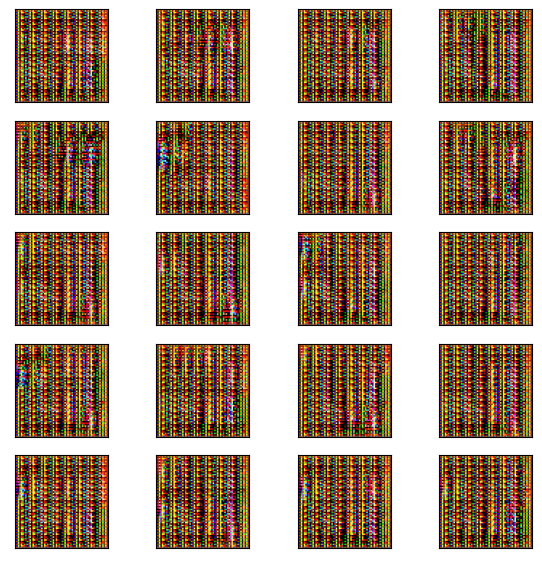

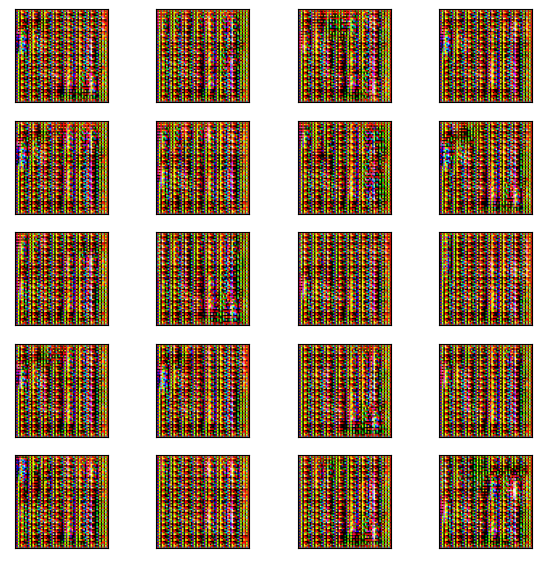

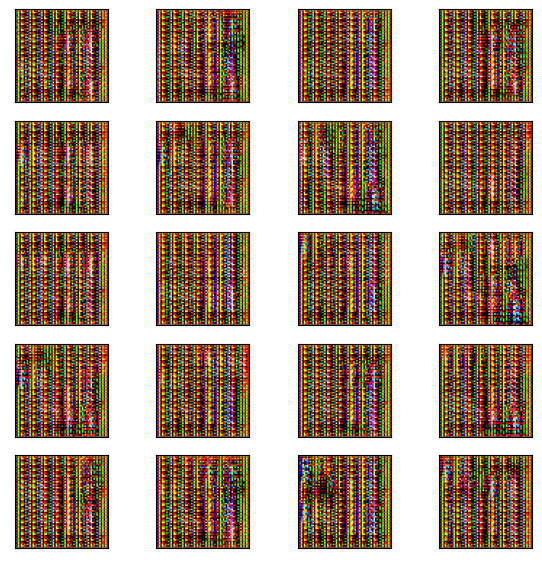

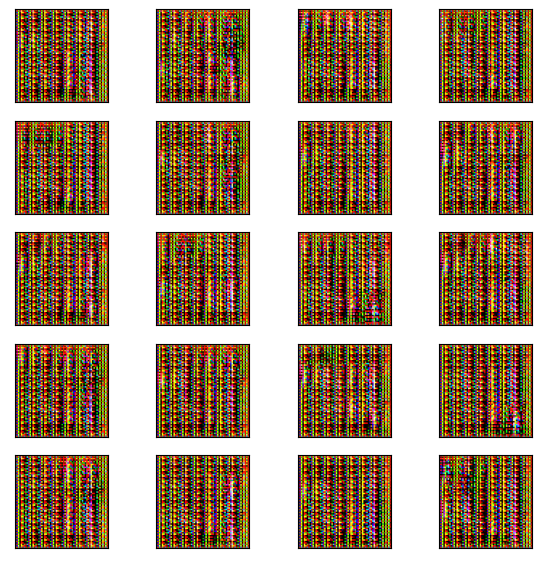

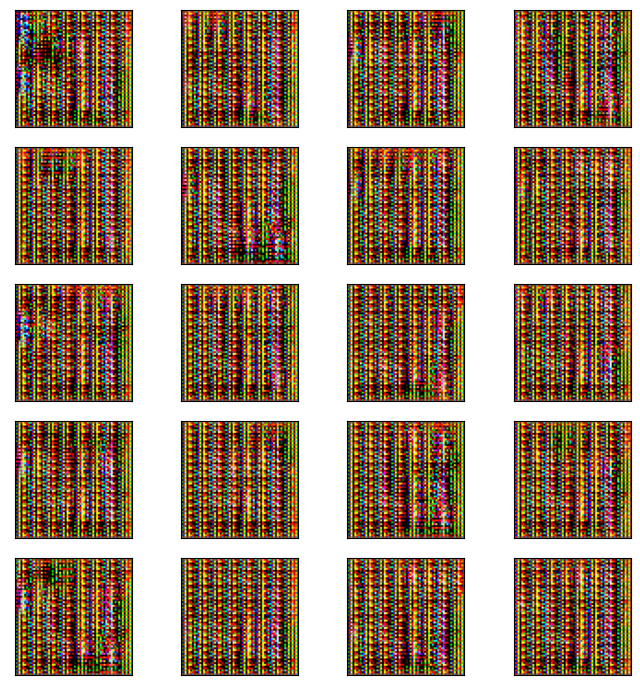

In [25]:
for i in range(5):
    plt.figure(figsize=(7,7))   
    for k in range(20):
        noise=np.random.uniform(-1,1,size=[100,noise_shape])
        im=generator.predict(noise) 
        plt.subplot(5, 4, k+1)
        plt.imshow(im[k].reshape(64,64,3))
        plt.xticks([])
        plt.yticks([])
 
plt.tight_layout()
plt.show()

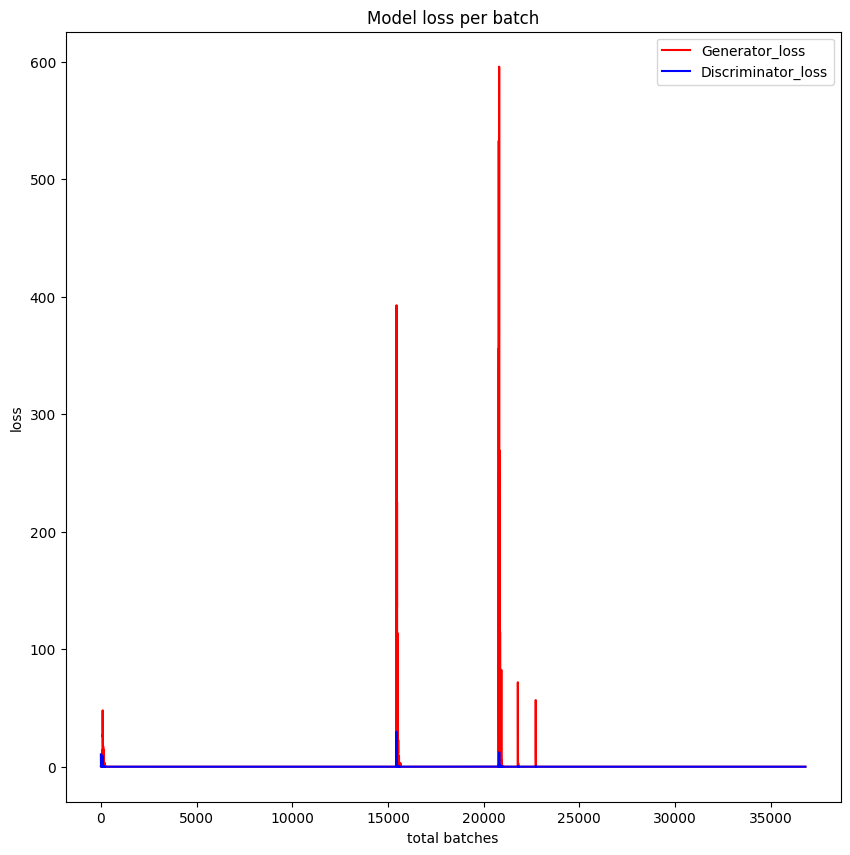

In [26]:
plt.figure(figsize=(10,10))
plt.plot(G_loss,color='red',label='Generator_loss')
plt.plot(D_loss,color='blue',label='Discriminator_loss')
plt.legend()
plt.xlabel('total batches')
plt.ylabel('loss')
plt.title('Model loss per batch')
plt.show()